## Alisha Sunuwar
#### CSci 39542 | Fall 2021

# Where should New Yorkers live if 311 service complaints and rent prices are their biggest concerns?

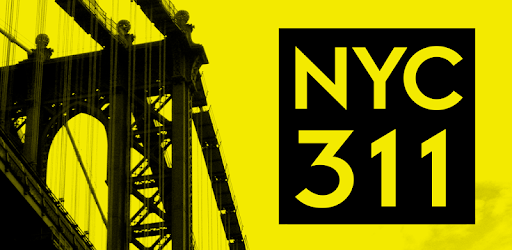

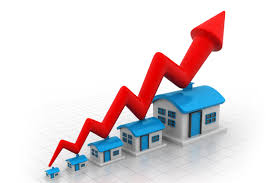

## What is this project about?
Shelter is a fundamental right and basic necessity that everyone should have. People should have the right to live in a peaceful neighborhood environment. I wanted to use data analysis, visualization, and other techniques to show how the number of 311 service requests and rent prices may affect people living around NYC. This includes studying the affordability of rental housing in the various boroughs surrounding NYC and comparing that to where the 311 service requests are happening. This analysis is something that I'm invested in since I have filed service complaints in the past and increasing NY rent prices is something that has a personal affect on me.

## Who is this for?
This analysis is for people living in the NY boroughs surrounding NYC. This project is an academic analysis to inform the reader where the 311 service complaints are happening and the rent prices at these areas.

## Security and Privacy Considerations
I did not with any personal identifiable information (PII) in this analysis. I worked with data provided by the government and from StreetEasy. The data sets does not include information that can be used for evil. I do not think my model can be misappropriately mis-used because it does not contain PII.


## Hypothesis
I think that 311 Service Requests are submitted in areas that contains a large population where there are lots of things to do. For example, New York City and Brooklyn may have the highest number of complaints submitted because that is where most tourists, residents, and workers are at - at any given point of time.

## Success Metric
I would define success if I could back up my hypotheses and qualitative thoughts with quantitative data. If the data and my findings overwhelmingly convinces the reader that my hypothesis is correct, then I would consider that as a successful study. A hypothesis is a specific statement of prediction. So even if my hypothesis is not correct, I would consider success as being able to comprehensively utilize what I learned in class in this practical exercise. One way to measure success is to take a look at the Value of information (VOI) which is how much a decision-maker is willing to pay for information before coming to a decision. While, I don't plans to monetize this project, it is possible to garner how much someone is willing to pay for my project, I think that as a substitute, if I were an incoming residents to NY, I believe success would be if my analysis sufficiently provides value to my users/readers. There may be some fair use legality issues which will prevent me from monetizing this analysis.

## Techniques/How was the analysis performed?
I will explain in each section of what data did I use, methods, and tools to test and explore the data sets. To sum it up, this project contains two main data sets: 1) 311 Service Requests 2) Rent prices. The focus of this project is to recommend to readers where they should live or places to avoid if 311 Service Requests complaints and rent prices are their top concerns when considering where to live around New York City. This project will focus heavily on descriptive statistics and geographical visualizations for the analysis. Before doing that the data needed to be collected, cleaned, and explored for data analysis to answer the initial questions of what is the data that I'm working with and why? SQL was used to perform data cleaning as well as traditional pandas data frame manipulation techniques. After going through the linear data science process, the models can be built. Towards the end, I built a 3-D visual using matplotlib's 3D plot library by performing linear regression and machine learning on the rental data that I cleaned.

## Data
#### 311 Service Requests Dataset
311's mission is to provide the public with quick, easy access to all NYC government services and information. NYC OpenData is free public data published by New York City agencies and other partners. NYC OpenData keeps track of 311 service requests from 2010 to present. 11 years of data is available for download, however, I did not want to download 27 million rows of data as it will be difficult for my computer to open that file, let alone having pandas run it. I filtered for data on NYC OpenData by the created date column for data pertaining to June 2016 then downloaded the data. This lowers the data set to 115 MB which is more manageable for pandas and for my laptop to open. Additionally, the rental datasets that I'm working with only contains data for June 2016.

#### StreetEasy Data sets
StreetEasy is a New York City local real estate marketplace providing comprehensive listings and market data.
The data frames contains sample data equating to 5,000 rental listing in Brooklyn, Manhattan, and Queens from June 2016.
On Github, there is already a combined CSV file, however, I choose to merge the files myself because it is good practice and an advantage to have multiple data frames is that if I wanted to manipulate data from only Brooklyn it will be easier and cleaner to work with that particular data set.
<br>
## Links
311 Service Request data set and explanation to what each of the column of data describes:
<br>https://data.cityofnewyork.us/Social-Services/311-Service-Requests-from-2010-to-Present/erm2-nwe9
<br>
<br>
StreetEasy New York rental data from June 2016
<br>https://github.com/Codecademy/datasets/tree/master/streeteasy
<br>
### Note: The citation page is at the very bottom of this page.

## Import Libraries
The below libraries contains useful functions that eliminates the need for writing code from scratch.

In [1]:
import bamboolib as bam # bamboolib is an extendable GUI that makes data cleaning and exploratory data analysis  more simple.
import geoplotlib as geoplot # For visualizing geographical data and making maps.
from geoplotlib.utils import read_csv, BoundingBox, DataAccessObject
import pandas as pd # For data analysis and manipulation
import pandasql as psql # For performing SQL queries

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from mpl_toolkits.mplot3d import Axes3D # For plotting 3-D visuals

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

%matplotlib inline

## 311 Service Requests Dataset
311's mission is to provide the public with quick, easy access to all NYC government services and information.
<br>
<br>
NYC OpenData is free public data published by New York City agencies and other partners.
<br>
<br>
NYC OpenData keeps track of 311 service requests from 2010 to present. 11 years of data is available for download, however, I did not want to download 27 million rows of data as it will be difficult for my computer to open that file, let alone having pandas run it. I filtered for data on NYC OpenData by the created date column for data pertaining to June 2016 then downloaded the data. This lowers the data set to 115 MB which is more manageable for pandas and for my laptop to open. Additionally, the rental datasets that I'm working with only contains data for June 2016.


## Allow user to enter the files 

In [2]:
input_file = input("Enter the file name :") # 311_Service_Requests_from_June2016.csv
input_file2= input("Enter the file name :") # brooklyn.csv
input_file3= input("Enter the file name :") # manhattan.csv
input_file4= input("Enter the file name :") # queens.csv


Enter the file name :311_Service_Requests_from_June2016.csv
Enter the file name :brooklyn.csv
Enter the file name :manhattan.csv
Enter the file name :queens.csv


## Inspect data frames

In [3]:
df = pd.read_csv(input_file) # Inspect 311_Service_Requests_from_June2016 file 
df # Inspect 311 service request data set from June 2016. 
# 208,667 rows x 41 columns

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location
0,33494342,06/01/2016 12:00:00 AM,06/24/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Standing Water,Other - Explain Below,Other,10030,WEST 140 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,33490212,06/01/2016 12:00:00 AM,06/01/2016 12:00:01 AM,DOHMH,Department of Health and Mental Hygiene,Food Poisoning,1 or 2,Restaurant/Bar/Deli/Bakery,10011,236 8 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.744725,-73.998888,"(40.74472493832409, -73.99888846709139)"
2,33476709,06/01/2016 12:00:00 AM,06/02/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Rodent,Mouse Sighting,3+ Family Apt. Building,11226,2513 TILDEN AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.646708,-73.953788,"(40.64670824607974, -73.95378779749592)"
3,33479347,06/01/2016 12:00:00 AM,06/06/2016 01:12:44 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11225,101 LINCOLN ROAD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.661057,-73.959116,"(40.66105723901385, -73.95911589501321)"
4,33480557,06/01/2016 12:00:00 AM,06/16/2016 02:16:25 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10474,711 FAILE STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.814756,-73.886558,"(40.81475595494672, -73.88655849893085)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208662,33740016,07/01/2016 12:00:00 AM,07/12/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11237,241 IRVING AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.700458,-73.916892,"(40.700457673266534, -73.91689233684714)"
208663,33740120,07/01/2016 12:00:00 AM,06/23/2016 04:59:20 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Mouse Sighting,3+ Family Apt. Building,11208,463 ELTON STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.671715,-73.882869,"(40.671715001102555, -73.88286882128105)"
208664,33740156,07/01/2016 12:00:00 AM,07/11/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Standing Water,Swimming Pool - Unmaintained,1-2 Family Dwelling,11234,7 BERGEN BEACH PLACE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.622496,-73.915066,"(40.622496343490326, -73.91506579979782)"
208665,33740216,07/01/2016 12:00:00 AM,07/13/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,10467,3038 MATTHEWS AVE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.870908,-73.862038,"(40.870907963532574, -73.86203848050742)"


In [4]:
df.info() # Information about the data set.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208667 entries, 0 to 208666
Data columns (total 41 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Unique Key                      208667 non-null  int64  
 1   Created Date                    208667 non-null  object 
 2   Closed Date                     202912 non-null  object 
 3   Agency                          208667 non-null  object 
 4   Agency Name                     208667 non-null  object 
 5   Complaint Type                  208667 non-null  object 
 6   Descriptor                      201610 non-null  object 
 7   Location Type                   160275 non-null  object 
 8   Incident Zip                    197631 non-null  object 
 9   Incident Address                165411 non-null  object 
 10  Street Name                     165399 non-null  object 
 11  Cross Street 1                  118144 non-null  object 
 12  Cross Street 2  

The above line of code tells me what columns exists in this data set and gives me a count of how many non-null records there are for each column along with the data type.

For this project, I'm most focus on the following columns: Created Date, Agency, Agency Name, Complaint Type, City, Borough, Latitude, and Longitude.

The following columns does not contain any missing records according to the 'Non-Null Count' information above: Created Date, Agency, Agency Name, Complaint Type. I am not concerned that there are missing city and borough values in the data set since I will visualize where the complaints are happening with the 'Latitude' and 'Longitude' data points. 

### Panda's describe method 
Quickly gives us aggregate statistics regarding the dataset.
<br>
<br> 
As expected the standard deviation (std) of the 'Latitude' and 'Longitude' columns is low ~0.08.
<br>
This means that most of the geographical data points are nearby each other.

In [5]:
df.describe() 

,Unique Key,BBL,Latitude,Longitude
count,2.086670e+05,1.485750e+05,188841.000000,188841.000000
mean,3.375841e+07,2.750488e+09,40.727844,-73.925582
std,1.102674e+06,1.189783e+09,0.084275,0.081902
min,3.347671e+07,0.000000e+00,40.498044,-74.251707
25%,3.354998e+07,2.027530e+09,40.668244,-73.972498
50%,3.361262e+07,3.020340e+09,40.720077,-73.930202
75%,3.367514e+07,4.008855e+09,40.796794,-73.877301
max,4.257539e+07,5.080500e+09,40.912869,-73.700788


Inspect the first 5 records in the 311 service request data set from June 2016.

In [6]:
df.head()

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location
0,33494342,06/01/2016 12:00:00 AM,06/24/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Standing Water,Other - Explain Below,Other,10030,WEST 140 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,33490212,06/01/2016 12:00:00 AM,06/01/2016 12:00:01 AM,DOHMH,Department of Health and Mental Hygiene,Food Poisoning,1 or 2,Restaurant/Bar/Deli/Bakery,10011,236 8 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.744725,-73.998888,"(40.74472493832409, -73.99888846709139)"
2,33476709,06/01/2016 12:00:00 AM,06/02/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Rodent,Mouse Sighting,3+ Family Apt. Building,11226,2513 TILDEN AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.646708,-73.953788,"(40.64670824607974, -73.95378779749592)"
3,33479347,06/01/2016 12:00:00 AM,06/06/2016 01:12:44 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11225,101 LINCOLN ROAD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.661057,-73.959116,"(40.66105723901385, -73.95911589501321)"
4,33480557,06/01/2016 12:00:00 AM,06/16/2016 02:16:25 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10474,711 FAILE STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.814756,-73.886558,"(40.81475595494672, -73.88655849893085)"


Inspect the last 5 records in the 311 service request data set from June 2016.

In [7]:
df.tail()

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location
208662,33740016,07/01/2016 12:00:00 AM,07/12/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11237,241 IRVING AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.700458,-73.916892,"(40.700457673266534, -73.91689233684714)"
208663,33740120,07/01/2016 12:00:00 AM,06/23/2016 04:59:20 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Mouse Sighting,3+ Family Apt. Building,11208,463 ELTON STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.671715,-73.882869,"(40.671715001102555, -73.88286882128105)"
208664,33740156,07/01/2016 12:00:00 AM,07/11/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Standing Water,Swimming Pool - Unmaintained,1-2 Family Dwelling,11234,7 BERGEN BEACH PLACE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.622496,-73.915066,"(40.622496343490326, -73.91506579979782)"
208665,33740216,07/01/2016 12:00:00 AM,07/13/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,10467,3038 MATTHEWS AVE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.870908,-73.862038,"(40.870907963532574, -73.86203848050742)"
208666,33740226,07/01/2016 12:00:00 AM,07/07/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11236,32 PAERDEGAT 11 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.628913,-73.904347,"(40.62891348247994, -73.90434706607573)"


As shown above, there are some records that are not from June 2016. It appears that when I was filtering for 311 service request complaints from June 2016, I filtered the 'Created Date' data from June 01, 2016 to July 01, 2016 12:00:00 AM. This is not a problem since I can drop the few complaints that happened to occur at July 1st exactly on the dot (12 AM).

The below line of code removes records where 'Created Date' is greater than or equal to 07/01/2016 and saves it to a new data frame.
<br> df_cleaned contains 208,521 records. 
<br> This means that there were 146 service complaints reported to 311 on July 1st, 2016 at exactly 12:00:00 AM. 

In [8]:
df_cleaned = df[~(df['Created Date'] >= '07/01/2016')]
df_cleaned

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location
0,33494342,06/01/2016 12:00:00 AM,06/24/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Standing Water,Other - Explain Below,Other,10030,WEST 140 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,33490212,06/01/2016 12:00:00 AM,06/01/2016 12:00:01 AM,DOHMH,Department of Health and Mental Hygiene,Food Poisoning,1 or 2,Restaurant/Bar/Deli/Bakery,10011,236 8 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.744725,-73.998888,"(40.74472493832409, -73.99888846709139)"
2,33476709,06/01/2016 12:00:00 AM,06/02/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Rodent,Mouse Sighting,3+ Family Apt. Building,11226,2513 TILDEN AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.646708,-73.953788,"(40.64670824607974, -73.95378779749592)"
3,33479347,06/01/2016 12:00:00 AM,06/06/2016 01:12:44 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11225,101 LINCOLN ROAD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.661057,-73.959116,"(40.66105723901385, -73.95911589501321)"
4,33480557,06/01/2016 12:00:00 AM,06/16/2016 02:16:25 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10474,711 FAILE STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.814756,-73.886558,"(40.81475595494672, -73.88655849893085)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208516,33729563,06/30/2016 11:58:54 PM,07/01/2016 02:35:56 PM,DPR,Department of Parks and Recreation,Maintenance or Facility,Structure - Outdoors,Park,10453,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
208517,33739475,06/30/2016 11:59:00 PM,07/02/2016 12:00:00 PM,DSNY,BCC - Queens East,Sanitation Condition,22 Weeds,Sidewalk,11692,188 BEACH 60 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.591621,-73.789592,"(40.59162081988596, -73.7895916119065)"
208518,33725224,06/30/2016 11:59:07 PM,07/01/2016 01:07:50 AM,NYPD,New York City Police Department,Noise - Commercial,Loud Music/Party,Club/Bar/Restaurant,11217,35 LAFAYETTE AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.686902,-73.977572,"(40.68690163261238, -73.97757227466931)"
208519,33730170,06/30/2016 11:59:17 PM,07/01/2016 05:40:05 AM,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,10456,1125 SHERIDAN AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.832157,-73.917888,"(40.83215658637434, -73.91788780497627)"


In [9]:
df_cleaned

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location
0,33494342,06/01/2016 12:00:00 AM,06/24/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Standing Water,Other - Explain Below,Other,10030,WEST 140 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,33490212,06/01/2016 12:00:00 AM,06/01/2016 12:00:01 AM,DOHMH,Department of Health and Mental Hygiene,Food Poisoning,1 or 2,Restaurant/Bar/Deli/Bakery,10011,236 8 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.744725,-73.998888,"(40.74472493832409, -73.99888846709139)"
2,33476709,06/01/2016 12:00:00 AM,06/02/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Rodent,Mouse Sighting,3+ Family Apt. Building,11226,2513 TILDEN AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.646708,-73.953788,"(40.64670824607974, -73.95378779749592)"
3,33479347,06/01/2016 12:00:00 AM,06/06/2016 01:12:44 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11225,101 LINCOLN ROAD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.661057,-73.959116,"(40.66105723901385, -73.95911589501321)"
4,33480557,06/01/2016 12:00:00 AM,06/16/2016 02:16:25 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10474,711 FAILE STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.814756,-73.886558,"(40.81475595494672, -73.88655849893085)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208516,33729563,06/30/2016 11:58:54 PM,07/01/2016 02:35:56 PM,DPR,Department of Parks and Recreation,Maintenance or Facility,Structure - Outdoors,Park,10453,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
208517,33739475,06/30/2016 11:59:00 PM,07/02/2016 12:00:00 PM,DSNY,BCC - Queens East,Sanitation Condition,22 Weeds,Sidewalk,11692,188 BEACH 60 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.591621,-73.789592,"(40.59162081988596, -73.7895916119065)"
208518,33725224,06/30/2016 11:59:07 PM,07/01/2016 01:07:50 AM,NYPD,New York City Police Department,Noise - Commercial,Loud Music/Party,Club/Bar/Restaurant,11217,35 LAFAYETTE AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.686902,-73.977572,"(40.68690163261238, -73.97757227466931)"
208519,33730170,06/30/2016 11:59:17 PM,07/01/2016 05:40:05 AM,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,10456,1125 SHERIDAN AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.832157,-73.917888,"(40.83215658637434, -73.91788780497627)"


## What are the top 10 agencies handling 311 Service requests?
Represents the responding City Government Agency that handled the request.
<br>
The New York Police Department (NYPD) handled approximately 1/3 of the 311 service cases that month followed by the Housing Preservation and Development Agency at 15.3%
<br>
It is not surprising to me that over 1/3 of the cases were handled by the NYPD because that department probably has the most resources available to be dispatched onto the streets.


In [10]:
bam.plot(df_cleaned, 'Agency')

TabSection(children=(BrowserCheck(), HBox(children=(Tab(closable=False, title='plot', _dom_classes=('bamboolib…

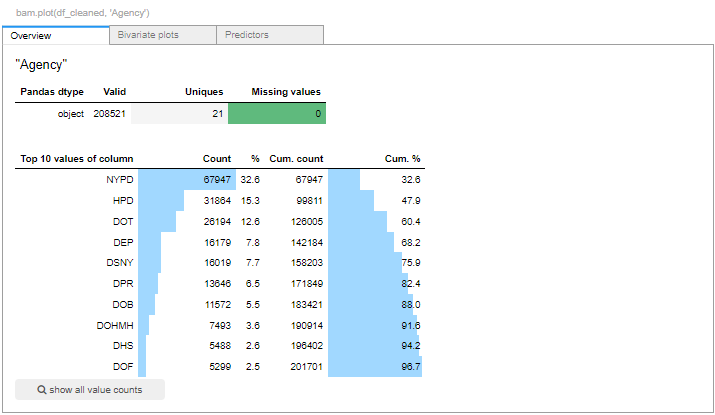

Below is the full name of the Agencies handling the complaints.

In [11]:
bam.plot(df_cleaned, 'Agency Name')

TabSection(children=(BrowserCheck(), HBox(children=(Tab(closable=False, title='plot', _dom_classes=('bamboolib…

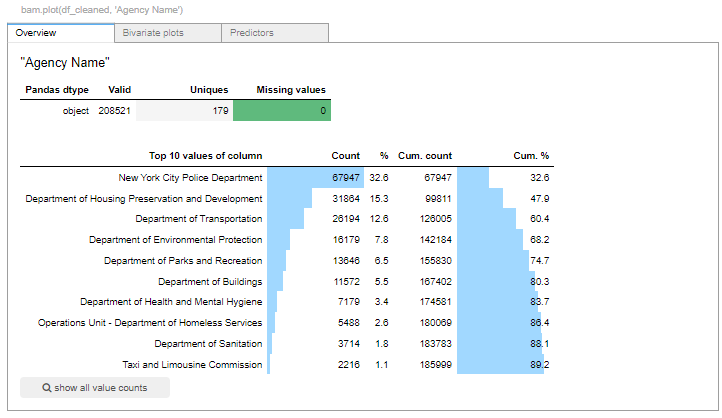

## What are the top 10 complaints that are filed?
The analysis below shows that the top 4 complaints has to do with noise and parking.
<br>
According to Google searches, the population in New York state in 2019 is 19.45 million in which,  New York county holds 8.419 million. 
<br>
That's a whole lot of people living in just five boroughs!
<br>
It is unsurprising to me that the top complaints filed to 311 have to deal with noise and parking seeing how congested New York really is.

In [12]:
bam.plot(df_cleaned, 'Complaint Type')

TabSection(children=(BrowserCheck(), HBox(children=(Tab(closable=False, title='plot', _dom_classes=('bamboolib…

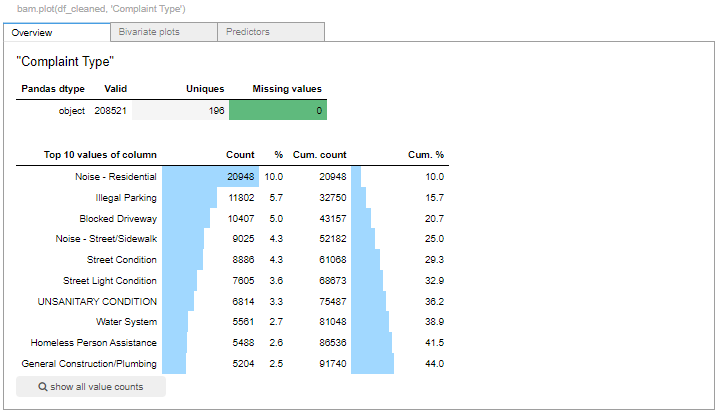

## What channel are these complaints being made on?
Open Data Channel Type indiciates how the service request was submitted to 311.
<br>
The majority of the complaints was filed by phone.
<br>
<br>
This is important to know because requests filed by talking to a person may hold a higher priority than complaints filed online. Perhaps, tickets filed online may be less descriptive and contain less data that was filled out.
<br>
Though this isn't the purpose of this analysis, this is something that user should consider regarding data quality and completeness.

In [13]:
bam.plot(df_cleaned, 'Open Data Channel Type')

TabSection(children=(BrowserCheck(), HBox(children=(Tab(closable=False, title='plot', _dom_classes=('bamboolib…

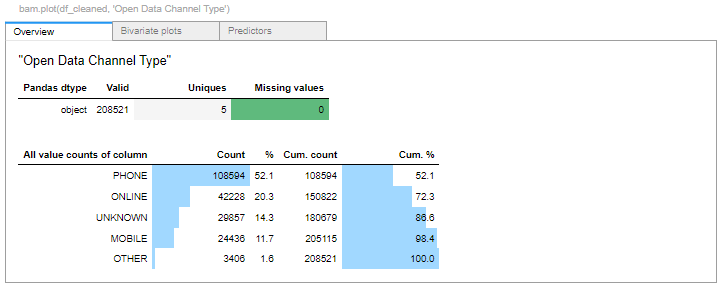

## Which boroughs contain the most complaints?
The borough field is provived by the request submitter and confirmed by geovalidation.
<br>
Suprisingly, Manhattan did not contain the first or second highest count of complaints.
<br>
Brooklyn contains nearly 1/3 of the complaints that were made in June 2016 followed by Queens, Manhattan, Bronx, and lastly Staten Island.
<br>
<br>

There are a few factors that the reader should consider.
According to Wikipedia, Brooklyn contains nearly 3x the amount of land area (69.4 square miles) than Manhattan at 22.7 square miles. Brooklyn has over 1 million more people than Manhattan.
<br>
It now makes sense to me that Brooklyn has the most complaints.
<br>
Queens borough has a similar population count compared to Brooklyn but has nearly 1/2 more land area and 1/2 less person density. I hypothesize that Queens county has less complaints compared to Brooklyn even though the population count is similar because there is more land area and less people cluttered together.

In [14]:
bam.plot(df_cleaned, 'Borough')

TabSection(children=(BrowserCheck(), HBox(children=(Tab(closable=False, title='plot', _dom_classes=('bamboolib…

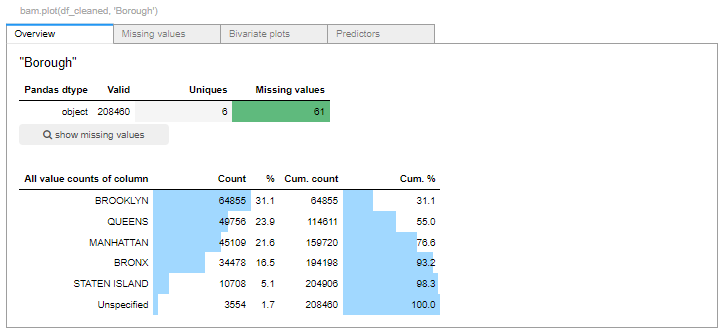

In [15]:
df_cleaned

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location
0,33494342,06/01/2016 12:00:00 AM,06/24/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Standing Water,Other - Explain Below,Other,10030,WEST 140 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,33490212,06/01/2016 12:00:00 AM,06/01/2016 12:00:01 AM,DOHMH,Department of Health and Mental Hygiene,Food Poisoning,1 or 2,Restaurant/Bar/Deli/Bakery,10011,236 8 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.744725,-73.998888,"(40.74472493832409, -73.99888846709139)"
2,33476709,06/01/2016 12:00:00 AM,06/02/2016 12:00:00 AM,DOHMH,Department of Health and Mental Hygiene,Rodent,Mouse Sighting,3+ Family Apt. Building,11226,2513 TILDEN AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.646708,-73.953788,"(40.64670824607974, -73.95378779749592)"
3,33479347,06/01/2016 12:00:00 AM,06/06/2016 01:12:44 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11225,101 LINCOLN ROAD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.661057,-73.959116,"(40.66105723901385, -73.95911589501321)"
4,33480557,06/01/2016 12:00:00 AM,06/16/2016 02:16:25 PM,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10474,711 FAILE STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.814756,-73.886558,"(40.81475595494672, -73.88655849893085)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208516,33729563,06/30/2016 11:58:54 PM,07/01/2016 02:35:56 PM,DPR,Department of Parks and Recreation,Maintenance or Facility,Structure - Outdoors,Park,10453,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
208517,33739475,06/30/2016 11:59:00 PM,07/02/2016 12:00:00 PM,DSNY,BCC - Queens East,Sanitation Condition,22 Weeds,Sidewalk,11692,188 BEACH 60 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.591621,-73.789592,"(40.59162081988596, -73.7895916119065)"
208518,33725224,06/30/2016 11:59:07 PM,07/01/2016 01:07:50 AM,NYPD,New York City Police Department,Noise - Commercial,Loud Music/Party,Club/Bar/Restaurant,11217,35 LAFAYETTE AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.686902,-73.977572,"(40.68690163261238, -73.97757227466931)"
208519,33730170,06/30/2016 11:59:17 PM,07/01/2016 05:40:05 AM,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,10456,1125 SHERIDAN AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.832157,-73.917888,"(40.83215658637434, -73.91788780497627)"


## Service Tickets By Borough

In [16]:
import plotly.express as px
fig = px.histogram(df_cleaned.sample(n=208521, replace=False, random_state=123).sort_index().dropna(subset=['Borough']), title='Service Tickets Per Borough', x='Borough')
fig.update_yaxes(title_text='yAxis title')
fig

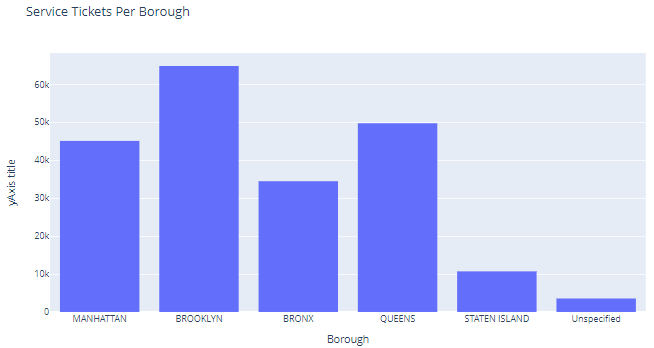

## Geographical Analysis
Geographical analysis involves seeking patterns, relationships, and connections.


Map_df represents a new data frame containing geographical data. 
<br>
Map_df contains: 208521  rows × 4 columns
<br>
As shown in the data frame below and earlier from using the info() method, there are some missing latitude and longitude data points. 
<br>
Specifically, there are 188841 records of non-null latitude and longitude records or 19,826 records that are empty that will need to be dropped.

In [17]:
Map_df = df_cleaned[["Latitude", "Longitude", "City", "Borough"]]
Map_df

,Latitude,Longitude,City,Borough
0,NaN,NaN,NEW YORK,MANHATTAN
1,40.744725,-73.998888,NEW YORK,MANHATTAN
2,40.646708,-73.953788,BROOKLYN,BROOKLYN
3,40.661057,-73.959116,BROOKLYN,BROOKLYN
4,40.814756,-73.886558,BRONX,BRONX
...,...,...,...,...
208516,NaN,NaN,BRONX,BRONX
208517,40.591621,-73.789592,Arverne,QUEENS
208518,40.686902,-73.977572,BROOKLYN,BROOKLYN
208519,40.832157,-73.917888,BRONX,BRONX


Allow user to choose a CSV output file name

In [18]:
csv_output_name = input("Enter output file name: ") # Map

Enter output file name: Map


In the below section, the Map_df data frame was cleaned using pandasql library so that the resulting output file will only contain two columns called: lat and lon which is short for latitude and longitude.
<br>
The query filters out the records where there are missing latitude or longitude values and produces two columns of data (lat and lon).
<br>
This new geographical data frame is then saved as Map1.csv

In [19]:
Map_query1 = 'SELECT Latitude AS lat, Longitude AS lon FROM Map_df WHERE Latitude OR Longitude IS NOT NULL' # There shouldn't be a need to drop rows where both Latitude and Longitude is NaN or empty because one field doesn't exist without the other.
queryresults1 = psql.sqldf(Map_query1)
queryresults1.to_csv(csv_output_name + "1.csv", index=False) # create 1st output file
queryresults1 # 188,698 rows × 2 columns; or a drop of 19,969 rows of empty rows

,lat,lon
0,40.744725,-73.998888
1,40.646708,-73.953788
2,40.661057,-73.959116
3,40.814756,-73.886558
4,40.741144,-73.865418
...,...,...
188693,40.770754,-73.956940
188694,40.591621,-73.789592
188695,40.686902,-73.977572
188696,40.832157,-73.917888


## Geoplotlib is used below to create a dot map, 2D histogram, and heatmap.

The four lines of code below generates the image you see below. When the line of code is ran, an interactive map is shown where you'll be able to pan across the screen and zoom in/out as you desire. I embeded a screenshot below just to show a holistic view of where the 311 service request complaints are concencrated.

As shown in the image, it appears that the boroughs that contains the most 311 Service Request complaints during June 2016 is Manhattan and Brooklyn. At a glance, Staten Island appears to have the least number of complaints followed by Queens borough where the complaints does not appear to concentrate heavily on any one area. 

## Dot Map

According to Wikipedia, Dot maps are a type of unit visualizations that rely on a visual scatter to show spatial patterns.
<br> Source: https://en.wikipedia.org/wiki/Dot_distribution_map#:~:text=Dot%20maps%20are%20a%20type,represent%20a%20number%20of%20individuals.
<br>
This is a great way to examine where the density of the points are concencrated.

In [20]:
map_data = read_csv('Map1.csv')
geoplot.set_window_size(1500,1000) # Set the geoplotlib window size
geoplot.dot(map_data, point_size=1, f_tooltip=None)
geoplot.show() 

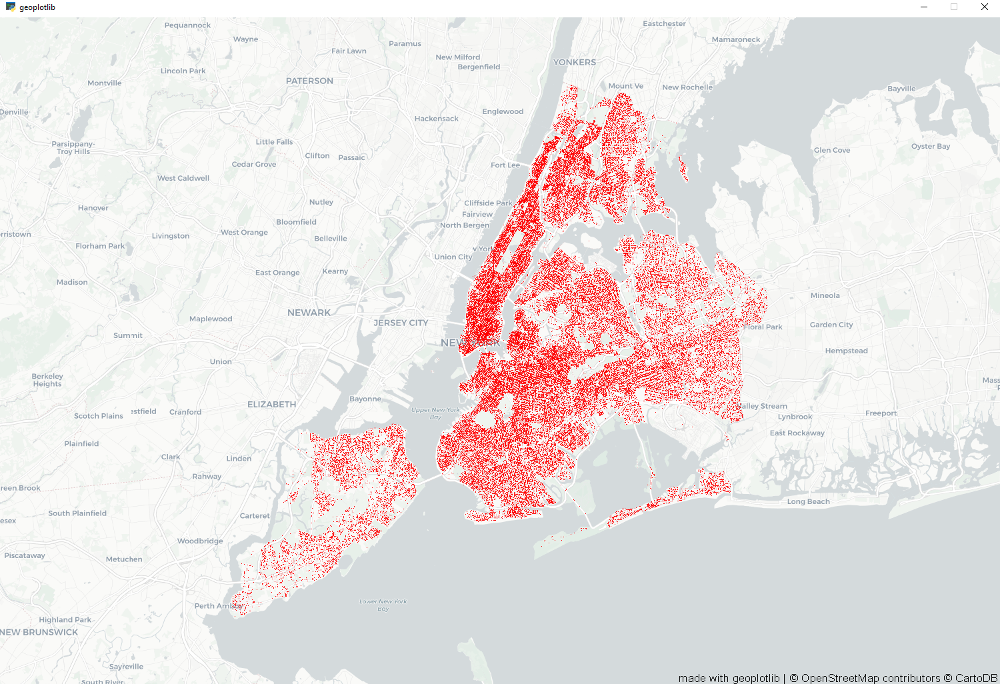

From the image shown above, I noticed that there appears to be a large number of complaints in lower manhattan. 
<br>
As shown in the image below, I can see more granular information such as the neighborhood names and the freeways. 
<br>
If wanted, the user can zoom in closer to a designated location to see the street names.

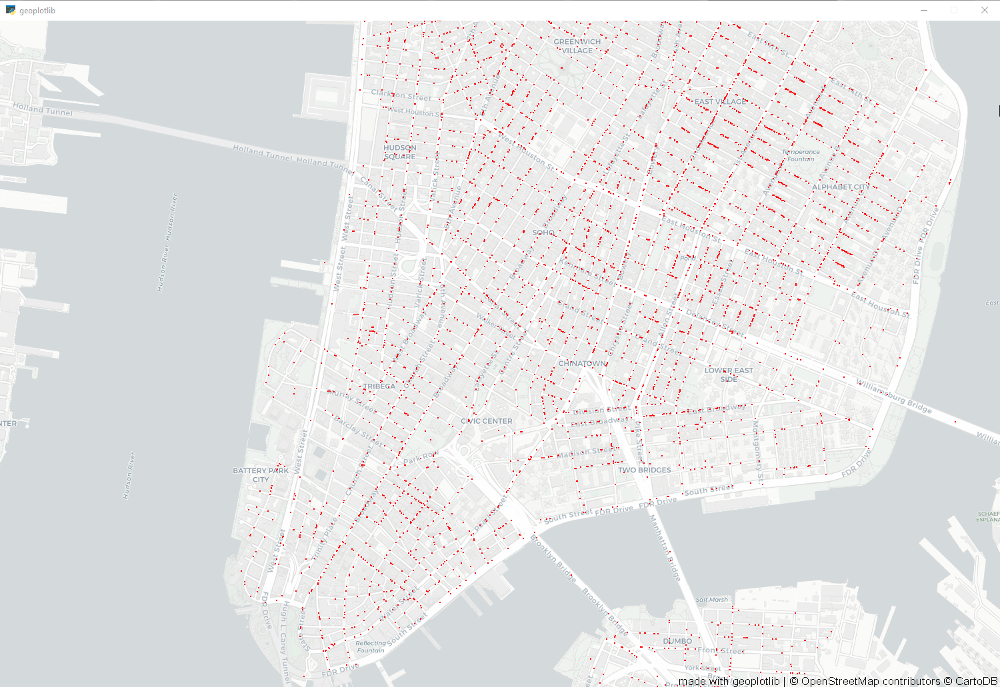

## 2D histogram
Dot maps are great for getting a sense of where the density occurs using scattered points but 2D histograms is a better way that mathematically computes density. The approximation of density is visualized using a color scale where each bin refers to the number of pixels of the histogram bins.

In [21]:
geoplot.hist(map_data, colorscale='sqrt', binsize=8)
geoplot.set_window_size(1500,1000) # Set the geoplotlib window size
geoplot.set_bbox(BoundingBox.DK)
geoplot.show()

As shown below, the areas with lower density of complaints is darker (black, dark red, red) in the color scale whereas the brighter colors (white, yellow, orange) is very dense.
<br>
Staten Island appears to have the least number of complaints as it contains darker bins such as black and dark red.
<br>
Upper Manhattan and eastern Queens borough also appears to have dark bins meaning that there are fewer complaints in those areas.
<br>
The areas near lower Manhattan appears to have a lot of complaints as signified by the yellow and white bins.

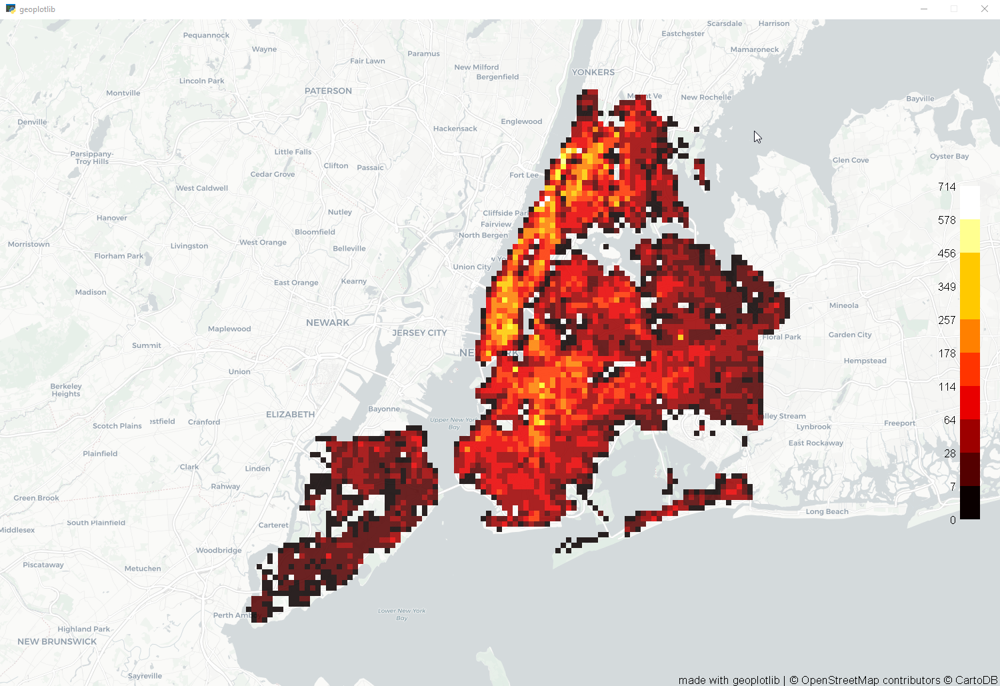

The image above can be enhanced so that the density bins are not hiding the geography behind it.
<br> 
A higher alpha value will make it harder to see where the Map boundaries. By choosing a smaller alpha value, the plot is somewhat transparent.

In [22]:
geoplot.hist(map_data, cmap='hot', alpha=75, colorscale='sqrt', binsize=8, show_tooltip=False, scalemin=0, scalemax=None, f_group=None)
geoplot.set_window_size(1500,1000) # Set the geoplotlib window size
geoplot.show()

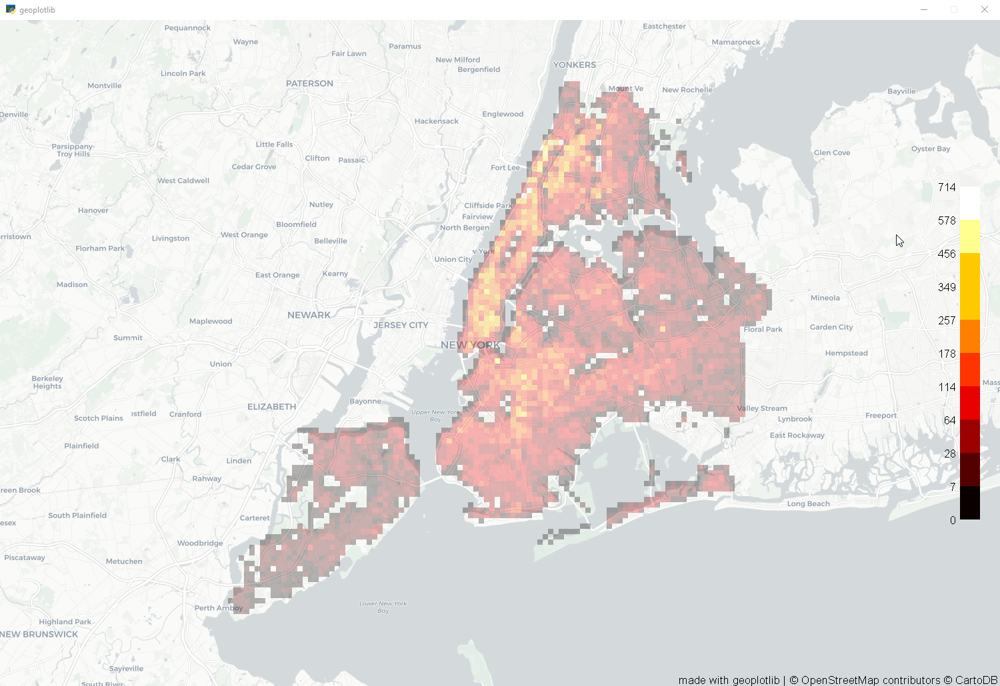

## Heat Map
The main drawback with using the histogram model is that it creates a dependency on the bin size and offset to represent density. For a smoother calculated approximation of density, kernel density estimator can be applied to approximate the true density by applying kernel functions in a window around each point. This means that by choosing a smaller bandwidth as a parameter, the image that is rendered will be more detailed but contains more noise estimation whereas a larger bandwth value will be less detailed but contain a smoother estimation.

In [23]:
geoplot.kde(map_data, bw = 7, cmap='hot', method='hist', scaling='sqrt', alpha=75, cut_below=None, clip_above=None, binsize=1, cmap_levels=5)
geoplot.set_bbox(BoundingBox.KBH)
geoplot.set_window_size(1500,1000)
geoplot.show()

no data in current view
('smallest non-zero count', 5.4102090238271095e-08)
('max count:', 555.548903188913)
('smallest non-zero count', 3.6555466377210197e-10)
('max count:', 93.35646218987792)
('smallest non-zero count', 3.6555466377210197e-10)
('max count:', 12.940125245626861)
('smallest non-zero count', 3.6555466377210197e-10)
('max count:', 5.663729084903501)
('smallest non-zero count', 3.6555466377210197e-10)
('max count:', 4.998351535140818)


Image where bandwidth = 7

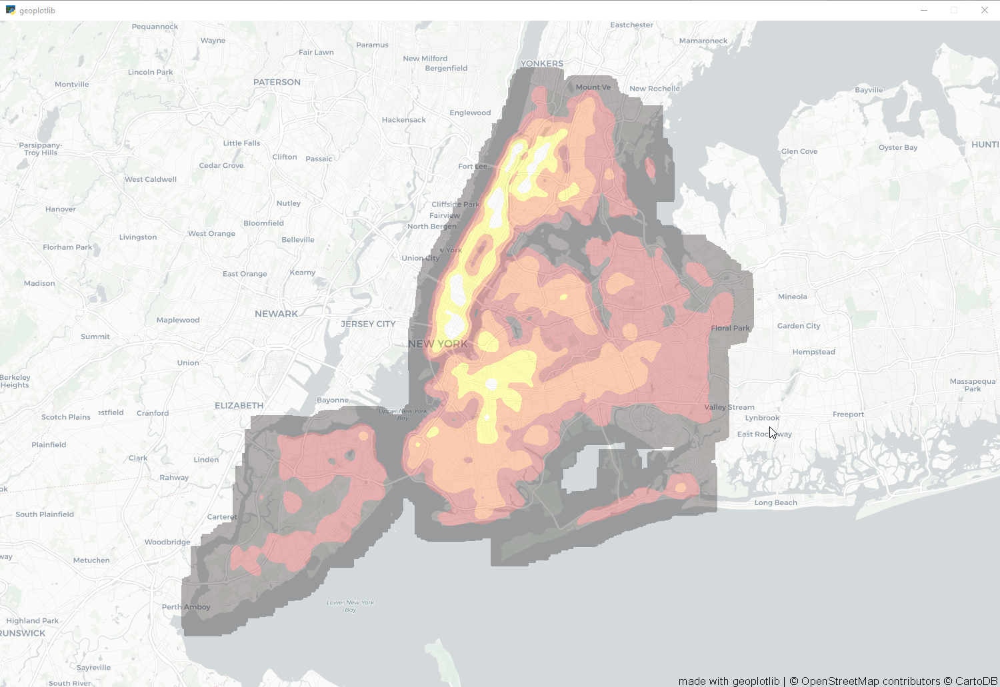

In [24]:
geoplot.kde(map_data, bw = 30, cmap='hot', method='hist', scaling='sqrt', alpha=75, cut_below=None, clip_above=None, binsize=1, cmap_levels=5)
geoplot.set_bbox(BoundingBox.KBH)
geoplot.set_window_size(1500,1000)
geoplot.show()

no data in current view
('smallest non-zero count', 1.9902935846927047e-11)
('max count:', 13.874102346679173)
('smallest non-zero count', 1.9902935846927047e-11)
('max count:', 2.1215957600462225)


Image where bandwidth = 30
<br>
<br>
What's the difference between the image below where bw = 30 vs the image above where bw = 7?
<br>
As shown in the image below, a higher bandwidth value results in an image that is less detailed but contains a smoother estimation. 
<br>
<br>
In descending order, from most complaints to least, the boroughs with the most complaints is the following: Manhattan, Brooklyn, Queens, and Staten Island.
<br>
It can be inferred from the image above that areas in yellow and white contains a lot more complaints than other surrounding areas. It contains a more detailed rendering. 

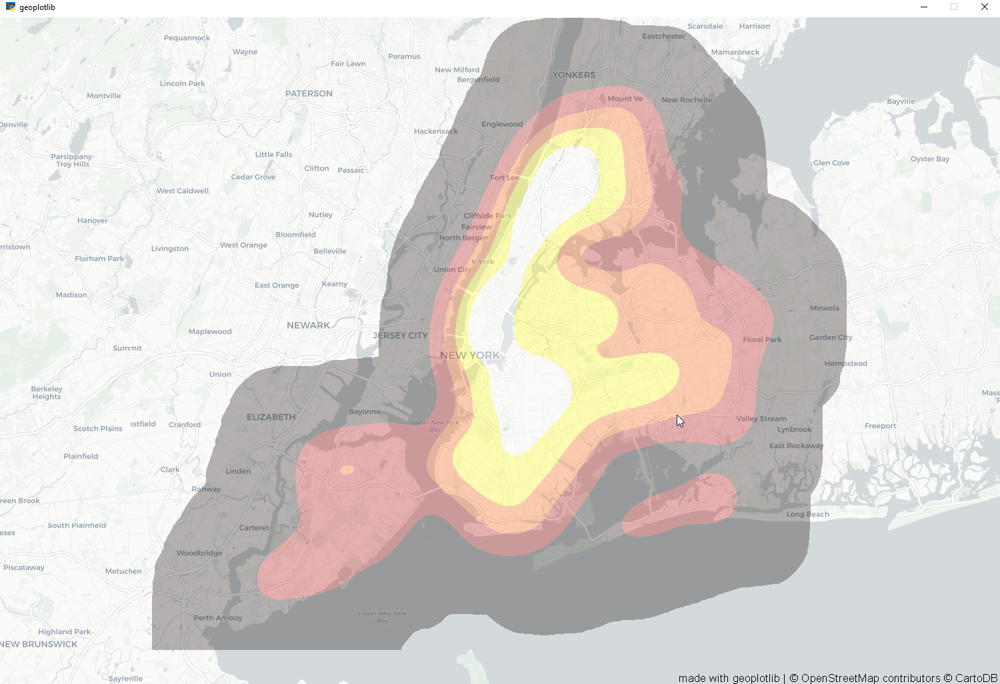

## 311 Service Request Analysis Findings

NYC OpenData contains very thorough information about government data. The advantage of working with dataset from the government is that the data can be trusted, may have a high degree of data quality; which reduces the amount of work needed to clean the data.
<br>
The bamboolib library was a great way to perform exploratory data analysis through interacting with a GUI for pandas DataFrames which helped enable me to analyze, visualize, and manipulate the data.
<br>
### Findings
The New York Police Department (NYPD) handled approximately 1/3 of the 311 service cases that month followed by the Housing Preservation and Development Agency at 15.3%. The top 4 complaints has to do with noise and parking. The majority of the complaints was filed by phone. Brooklyn contains the most complaints at 31.1% of the total complaints in June 2016 followed by Queens, Manhattan, Bronx, and lastly Staten Island. The heat map diagram shows that Manhattan has the highest concentration of service complaints followed by Brooklyn. 

<br> 
## What does this mean? 
Brooklyn contained the most service requests in June 2016 but it doesn't mean that people should avoid living there. As shown in the heat map diagram, Manhattan contains the largest stretch of service complaints in it's land area. Whereas, Brooklyn's service complaints are centered at one area. Brooklyn contains nearly 3x the amount of land area compared to Manhattan. 




# StreetEasy Rental Analysis  
StreetEasy is a New York City local real estate marketplace providing comprehensive listings and market data.
The below data frames contains sample data from 5,000 rental listing in Brooklyn, Manhattan, and Queens from June 2016.
<br>
<br>
On Github, there is already a combined CSV file, however, I choose to merge the files myself because it is good practice and an advantage to have multiple data frames is that if I wanted to manipulate data from only Brooklyn it will be easier and cleaner to work with that particular data set.

## Inspect data frames

In [25]:
brooklyn_df = pd.read_csv(input_file2)
brooklyn_df

,rental_id,rent,bedrooms,bathrooms,size_sqft,min_to_subway,floor,building_age_yrs,no_fee,has_roofdeck,has_washer_dryer,has_doorman,has_elevator,has_dishwasher,has_patio,has_gym,neighborhood,borough
0,2869,3600,3.0,2,900,4,1.0,15,1,0,0,0,0,0,0,0,Williamsburg,Brooklyn
1,4318,3900,3.0,2,1000,4,9.0,8,0,0,0,0,1,0,0,0,Greenwood,Brooklyn
2,6265,2700,2.0,1,900,4,2.0,96,0,0,0,0,0,0,0,0,Gowanus,Brooklyn
3,24,4900,1.0,1,1216,6,3.0,88,0,0,0,0,0,0,0,0,Brooklyn Heights,Brooklyn
4,9481,3900,0.0,1,1100,3,4.0,85,1,0,0,0,0,0,0,0,Williamsburg,Brooklyn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1008,7329,2300,1.0,1,900,5,2.0,88,0,0,0,0,0,0,0,0,Greenpoint,Brooklyn
1009,10286,3750,3.0,2,1531,1,1.0,10,0,0,1,1,1,1,0,0,Crown Heights,Brooklyn
1010,9169,4000,2.0,1,1080,5,1.0,117,0,0,0,0,0,0,0,0,Williamsburg,Brooklyn
1011,1721,4200,2.0,2,977,1,5.0,5,1,0,0,0,0,0,0,0,Downtown Brooklyn,Brooklyn


In [26]:
manhattan_df = pd.read_csv(input_file3)
manhattan_df

,rental_id,rent,bedrooms,bathrooms,size_sqft,min_to_subway,floor,building_age_yrs,no_fee,has_roofdeck,has_washer_dryer,has_doorman,has_elevator,has_dishwasher,has_patio,has_gym,neighborhood,borough
0,1545,2550,0.0,1,480,9,2.0,17,1,1,0,0,1,1,0,1,Upper East Side,Manhattan
1,2472,11500,2.0,2,2000,4,1.0,96,0,0,0,0,0,0,0,0,Greenwich Village,Manhattan
2,2919,4500,1.0,1,916,2,51.0,29,0,1,0,1,1,1,0,0,Midtown,Manhattan
3,2790,4795,1.0,1,975,3,8.0,31,0,0,0,1,1,1,0,1,Greenwich Village,Manhattan
4,3946,17500,2.0,2,4800,3,4.0,136,0,0,0,1,1,1,0,1,Soho,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3534,7582,4210,1.0,1,532,3,8.0,16,1,1,1,1,1,1,0,1,Chelsea,Manhattan
3535,5686,6675,2.0,2,988,5,10.0,9,1,1,1,1,1,1,0,1,Tribeca,Manhattan
3536,9679,1699,0.0,1,250,2,5.0,96,0,0,0,0,0,0,0,0,Little Italy,Manhattan
3537,5188,3475,1.0,1,651,6,5.0,14,1,0,1,1,1,1,0,1,Midtown West,Manhattan


In [27]:
queens_df = pd.read_csv(input_file4)
queens_df

,rental_id,rent,bedrooms,bathrooms,size_sqft,min_to_subway,floor,building_age_yrs,no_fee,has_roofdeck,has_washer_dryer,has_doorman,has_elevator,has_dishwasher,has_patio,has_gym,neighborhood,borough
0,10234,3000,3.0,1,1000,4,1.0,106,0,0,0,0,0,0,0,0,Astoria,Queens
1,10524,1950,1.0,1,950,1,3.0,83,0,0,0,0,0,0,0,0,Forest Hills,Queens
2,5465,3500,1.0,1,996,9,7.0,3,1,0,0,0,0,0,0,0,Astoria,Queens
3,5259,1725,1.0,1,800,1,2.0,89,0,0,0,0,0,0,0,0,Astoria,Queens
4,9736,1700,1.0,1,730,10,3.0,7,0,0,0,0,0,0,0,0,Briarwood,Queens
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,6760,3750,2.0,0,1047,10,13.0,6,1,0,0,0,0,0,0,0,Astoria,Queens
444,1614,2950,2.0,2,1038,10,5.0,5,0,0,0,0,0,0,0,0,Astoria,Queens
445,11245,2200,1.0,1,850,4,3.0,62,1,0,0,0,0,0,0,0,Forest Hills,Queens
446,6070,2250,2.0,1,1100,14,5.0,60,1,0,0,0,0,0,0,0,Flushing,Queens


## Merge StreetEasy Borough Files

In [28]:
StreetEasy_df = 'SELECT *  FROM brooklyn_df b UNION SELECT *  FROM manhattan_df m UNION SELECT *  FROM queens_df q'
StreeEasy_query = psql.sqldf(StreetEasy_df)
StreeEasy_query

,rental_id,rent,bedrooms,bathrooms,size_sqft,min_to_subway,floor,building_age_yrs,no_fee,has_roofdeck,has_washer_dryer,has_doorman,has_elevator,has_dishwasher,has_patio,has_gym,neighborhood,borough
0,1,3500,1.0,1,850,3,18.0,54,0,0,0,0,0,0,0,0,Upper West Side,Manhattan
1,2,4200,1.0,1,809,5,14.0,91,0,0,0,0,0,0,0,0,Upper East Side,Manhattan
2,4,8995,2.0,2,1667,11,40.0,31,0,0,0,1,0,0,0,0,Upper East Side,Manhattan
3,5,1875,0.0,1,450,3,5.0,116,0,0,0,1,0,0,0,0,Midtown West,Manhattan
4,6,4000,1.0,1,830,1,8.0,88,0,1,0,1,1,0,0,1,Financial District,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11343,2200,2.0,1,1200,3,4.0,103,0,0,0,0,0,0,0,0,Prospect Park South,Brooklyn
4996,11344,3290,1.0,1,750,2,10.0,89,0,0,0,0,0,0,0,0,Midtown,Manhattan
4997,11345,5995,3.0,1,1270,2,22.0,41,0,0,0,0,0,0,0,0,Upper West Side,Manhattan
4998,11348,4500,1.0,1,900,3,38.0,29,0,1,0,1,1,0,0,1,Upper East Side,Manhattan


In [29]:
csv_output_name = input("Enter output file name: ") # StreetEasy_combined

Enter output file name: StreetEasy_combined


In [30]:
StreeEasy_query.to_csv(csv_output_name + "1.csv", index=False) # create 1st output file
StreeEasy_query # 5000 rows × 19 columns

,rental_id,rent,bedrooms,bathrooms,size_sqft,min_to_subway,floor,building_age_yrs,no_fee,has_roofdeck,has_washer_dryer,has_doorman,has_elevator,has_dishwasher,has_patio,has_gym,neighborhood,borough
0,1,3500,1.0,1,850,3,18.0,54,0,0,0,0,0,0,0,0,Upper West Side,Manhattan
1,2,4200,1.0,1,809,5,14.0,91,0,0,0,0,0,0,0,0,Upper East Side,Manhattan
2,4,8995,2.0,2,1667,11,40.0,31,0,0,0,1,0,0,0,0,Upper East Side,Manhattan
3,5,1875,0.0,1,450,3,5.0,116,0,0,0,1,0,0,0,0,Midtown West,Manhattan
4,6,4000,1.0,1,830,1,8.0,88,0,1,0,1,1,0,0,1,Financial District,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11343,2200,2.0,1,1200,3,4.0,103,0,0,0,0,0,0,0,0,Prospect Park South,Brooklyn
4996,11344,3290,1.0,1,750,2,10.0,89,0,0,0,0,0,0,0,0,Midtown,Manhattan
4997,11345,5995,3.0,1,1270,2,22.0,41,0,0,0,0,0,0,0,0,Upper West Side,Manhattan
4998,11348,4500,1.0,1,900,3,38.0,29,0,1,0,1,1,0,0,1,Upper East Side,Manhattan


In [31]:
StreeEasy_df = pd.DataFrame(StreeEasy_query)
StreeEasy_df

,rental_id,rent,bedrooms,bathrooms,size_sqft,min_to_subway,floor,building_age_yrs,no_fee,has_roofdeck,has_washer_dryer,has_doorman,has_elevator,has_dishwasher,has_patio,has_gym,neighborhood,borough
0,1,3500,1.0,1,850,3,18.0,54,0,0,0,0,0,0,0,0,Upper West Side,Manhattan
1,2,4200,1.0,1,809,5,14.0,91,0,0,0,0,0,0,0,0,Upper East Side,Manhattan
2,4,8995,2.0,2,1667,11,40.0,31,0,0,0,1,0,0,0,0,Upper East Side,Manhattan
3,5,1875,0.0,1,450,3,5.0,116,0,0,0,1,0,0,0,0,Midtown West,Manhattan
4,6,4000,1.0,1,830,1,8.0,88,0,1,0,1,1,0,0,1,Financial District,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11343,2200,2.0,1,1200,3,4.0,103,0,0,0,0,0,0,0,0,Prospect Park South,Brooklyn
4996,11344,3290,1.0,1,750,2,10.0,89,0,0,0,0,0,0,0,0,Midtown,Manhattan
4997,11345,5995,3.0,1,1270,2,22.0,41,0,0,0,0,0,0,0,0,Upper West Side,Manhattan
4998,11348,4500,1.0,1,900,3,38.0,29,0,1,0,1,1,0,0,1,Upper East Side,Manhattan


## Descriptive Statistics
This section focuses on getting summary statistics such as finding out the average, median, and standard deviation of a column of data. This is important because outliers can influence the average value of something whereas median statistics lets us know what the person in the 50% percentile is paying for their rental.

In [32]:
# Brooklyn
brooklyn_avg_rent = np.mean(brooklyn_df['rent'])
brooklyn_rent_sd = np.std(brooklyn_df['rent'])
brooklyn_rent_median = np.median(brooklyn_df['rent'])

brooklyn_max_buildingAge = np.max(brooklyn_df['building_age_yrs'])
brooklyn_avg_buildingAge = np.mean(brooklyn_df['building_age_yrs'])
brooklyn_rent_buildingAge = np.median(brooklyn_df['building_age_yrs'])


In [33]:
# Manhattan
manhattan_avg_rent = np.mean(manhattan_df['rent'])
manhattan_rent_sd = np.std(manhattan_df['rent'])
manhattan_rent_median = np.median(manhattan_df['rent'])

manhattan_max_buildingAge = np.max(manhattan_df['building_age_yrs'])
manhattan_avg_buildingAge = np.mean(manhattan_df['building_age_yrs'])
manhattan_rent_buildingAge = np.median(manhattan_df['building_age_yrs'])

In [34]:
# Queens
queens_avg_rent = np.mean(queens_df['rent'])
queens_rent_sd = np.std(queens_df['rent'])
queens_rent_median = np.median(queens_df['rent'])

queens_max_buildingAge = np.max(queens_df['building_age_yrs'])
queens_avg_buildingAge = np.mean(queens_df['building_age_yrs'])
queens_rent_buildingAge = np.median(queens_df['building_age_yrs'])

In [35]:
print('The average price of rent in Brooklyn is $' + str(round(brooklyn_avg_rent, 2)))
print('The median price of rent in Brooklyn is $' + str(round(brooklyn_rent_median, 2)))
print('The standard deviation of rent prices in Brooklyn is $' +  str(round(brooklyn_rent_sd, 2)))

print('The oldest building in Brooklyn is ' +  str(brooklyn_max_buildingAge) + ' years old')
print('The average building age in Brooklyn is ' +  str(round(brooklyn_avg_buildingAge,1)) + ' years old')
print('The median building in Brooklyn is ' +  str(round(brooklyn_rent_buildingAge,1)) + ' years old')

The average price of rent in Brooklyn is $3327.4
The median price of rent in Brooklyn is $3000.0
The standard deviation of rent prices in Brooklyn is $1601.6
The oldest building in Brooklyn is 174 years old
The average building age in Brooklyn is 55.7 years old
The median building in Brooklyn is 77.0 years old


In [36]:
print('The average price of rent in Manhattan is $' + str(round(manhattan_avg_rent, 2)))
print('The median price of rent in Manhattan is $' + str(round(manhattan_rent_median, 2)))
print('The standard deviation of rent prices in Manhattan is $' +  str(round(manhattan_rent_sd, 2)))

print('The oldest building in Manhattan is ' +  str(manhattan_max_buildingAge) + ' years old')
print('The average building age in Manhattan is ' +  str(round(manhattan_avg_buildingAge,1)) + ' years old')
print('The median building in Manhattan is ' +  str(round(manhattan_rent_buildingAge,1)) + ' years old')

The average price of rent in Manhattan is $5138.94
The median price of rent in Manhattan is $4000.0
The standard deviation of rent prices in Manhattan is $3162.38
The oldest building in Manhattan is 180 years old
The average building age in Manhattan is 52.0 years old
The median building in Manhattan is 39.0 years old


In [37]:
print('The average price of rent in Queens is $' + str(round(queens_avg_rent, 2)))
print('The median price of rent in Queens is $' + str(round(queens_rent_median, 2)))
print('The standard deviation of rent prices in Queens is $' +  str(round(queens_rent_sd, 2)))

print('The oldest building in Queens is ' +  str(queens_max_buildingAge) + ' years old')
print('The average building age in Queens is ' +  str(round(queens_avg_buildingAge,1)) + ' years old')
print('The median building in Queens is ' +  str(round(queens_rent_buildingAge,1)) + ' years old')

The average price of rent in Queens is $2516.15
The median price of rent in Queens is $2350.0
The standard deviation of rent prices in Queens is $853.66
The oldest building in Queens is 126 years old
The average building age in Queens is 44.6 years old
The median building in Queens is 53.5 years old


## Sparsity - 3D Plot through Ordinary Linear Regression (OLS)
According the the descriptive statistics analysis, Queens is the most affordable borough to live in followed by Brooklyn then Manhattan. New York is known for being one of the most expensive places to live in the world while having some of the oldest buildings per square foot. I wanted to compare all three of these variables in a visual.


In [38]:
x = StreeEasy_df[['size_sqft','building_age_yrs']]
y = StreeEasy_df[['rent']]

The train_test_split function allows for split arrary or matrices into random train and test subsets.
<br>
Linear Regression is a linear approach for modeling the best fit line that best describes that scattered datapoints on a plot.
<br>
Ordinary linear regression analysis is performed using scikit-learn on Rent vs Building Age vs Rent using the data that was trained.


In [39]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = 0.8, test_size = 0.2, random_state=6)

ols = LinearRegression()

ols.fit(x_train, y_train)

LinearRegression()

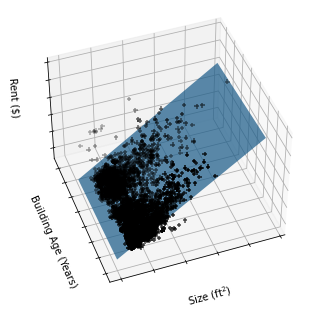

In [40]:
fig = plt.figure(1, figsize=(6, 4))
plt.clf()

elev = 43.5
azim = -110

ax = Axes3D(fig, elev=elev, azim=azim)
ax.scatter(x_train[['size_sqft']], x_train[['building_age_yrs']], y_train, c='k', marker='+')

ax.plot_surface(np.array([[0, 0], [4500, 4500]]), np.array([[0, 140], [0, 140]]), ols.predict(np.array([[0, 0, 4500, 4500], [0, 140, 0, 140]]).T).reshape((2, 2)), alpha=.7)

ax.set_xlabel('Size (ft$^2$)')
ax.set_ylabel('Building Age (Years)')
ax.set_zlabel('Rent ($)')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])

plt.show()

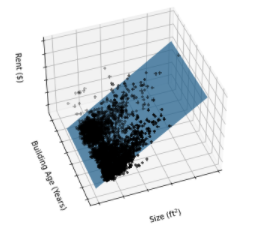

The  3D visual contains information about building age, apartment size, and rent. The blue plane is a fit of the linear model that minimizes residual sum of squares between the observed targets in the dataset and the targets predicted through linear approximation.
<br>
<br>
What does this mean?
<br>
As we can see in the graph, the plane points up and to the right. This means that rental units that are larger has a higher rental price in general. There doesn't appear to be a significant relationship between building age with the size of the rental units and rent price. 

## Conclusion

The purpose of this analysis is to help answer "Where should New Yorkers live if 311 service complaints and rent prices are their biggest concerns?" As we saw in the StreetEasy analysis, there isn't a significant relationship between the age of a building compared to its rent price and unit size. Rental units that are larger costs more money as visualized in the 3-D visual. It appears that Manhattan has the oldest building unit for rental compared to Brooklyn and Queens but also has the lowest median building age. This may mean that contractors are building new residential apartments in Manhattan at a faster rate compared to the neighboring boroughs. Newer apartments means there may be a bigger demand for rental housing in Manhattan.


### So where should you live?

This analysis focuses on only two factors that people may consider when figuring out where they should live. Manhattan has the highest number of 311 service complaints while also having the highest rent price. Brooklyn has a large number of complaints centered at one large area. There are fewer service complaints being made the further away the apartment is from Manhattan. Queens has the lowest number of service complaints by area while also having the lowest median and average price for rent.
<br>
<br>
I recommend New Yorkers to live in Queens if 311 Service complaints and rent prices are their biggest concerns.

## Works Cited

#### Datasets:
311 Service Request data set:
https://data.cityofnewyork.us/Social-Services/311-Service-Requests-from-2010-to-Present/erm2-nwe9

StreetEasy New York rental data from June 2016
https://github.com/Codecademy/datasets/tree/master/streeteasy


#### Cover page images:
311 image: https://play.google.com/store/apps/details?id=gov.nyc.doitt.ThreeOneOne&hl=en_US&gl=US

Rising rent prices image: https://www.homeunion.com/rising-property-prices-and-rents-investors-contribute-to-one-third-of-property-sales/


#### Misc:

Data science readings: http://www.textbook.ds100.org/intro.html

311's mission: https://portal.311.nyc.gov/about-nyc-311/

Data Science Process: https://towardsdatascience.com/the-data-science-process-a19eb7ebc41b

Geographical analysis definition: https://www.nationalgeographic.org/geographic-skills/4/

Geopgraphical Visualization through Geoplotlib: https://medium.com/@labdheesheth/visualizing-geographical-data-using-geoplotlib-d732953abcd5

Matplotlib 3d: https://matplotlib.org/stable/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html

Sharing Jupyter Notebook in case Github has trouble rending: https://nbviewer.org/

Visualization libraries: https://mode.com/blog/python-data-visualization-libraries/#geoplotlib

Scikit-learn training: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

SQL in Pandas: https://towardsdatascience.com/how-to-use-sql-in-pandas-62d8a0f6341

